# Otoczka wypukła

In [1]:
import numpy as np
import pandas as pd
from bitalg.tests.test2 import Test
from bitalg.visualizer.main import Visualizer
np.random.seed(23442)

### Przykładowe zastosowanie narzędzia do wizualizacji

In [2]:

def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color="green")
    vis.add_line_segment(line_segments, color="blue")
    vis.show()

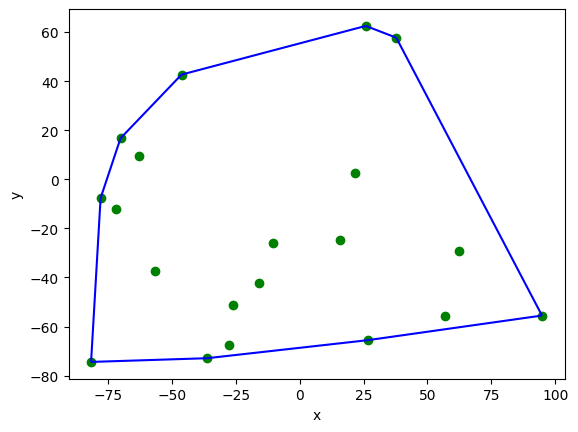

In [3]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zafinal_tabowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [4]:
def generate_uniform_points(left=-100, right=100, n=100):
    """
    Funkcja generuje równomiernie n punktów na kwadwratowym
    obszarze od left do right (jednakowo na osi y)
    o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
             np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    points = np.random.uniform(left,right,size = (n,2))
    return [tuple(point) for point in points]

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [5]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

In [6]:
# visualize(points_a)
vis = Visualizer()
vis.add_point(points_a)
vis.show()

NameError: name 'points_a' is not defined

Uzupełnij funkcję ```generate_circle_points```.

In [3]:
def generate_circle_points(O, R, n=100):
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    x0,y0 = O
    points = []
    for _ in range(n):
        t = np.random.uniform(0,4,1)[0]
        x = R*(np.cos(np.pi*t/2))+x0
        y = R*(np.sin(np.pi*t/2))+y0
        points.append((x, y))
    return points

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [15]:
points_b = generate_circle_points((5, 5), 4, 9)

Zwizualizuj wygenerowane punkty.

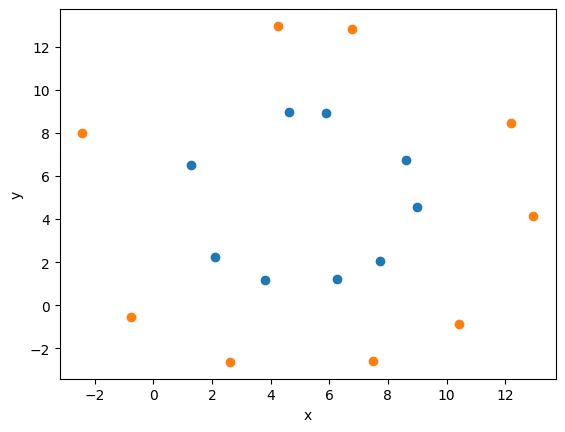

In [50]:
# visualize(points_b)
from math import sqrt
vis.clear()
vis.add_point(points_b)
points_b2 = []
for x,y in points_b:
    
    if y<5:
        x = 2*(x-5) + 5
        y2=-sqrt(64-(x-5)**2)+5
    else:
        x = 2*(x-5) + 5
        y2=sqrt(64-(x-5)**2)+5
    points_b2.append((float(x),float(y2)))
vis.add_point(points_b2)
vis.show()
t2=[]
for x,y in points_b:
    t2.append((float(x),float(y)))


Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [9]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    '''
    Funkcja generuje n punktów na obwodzie prostokąta
    o wierzchołkach w punktach a, b, c i d
    :param a: lewy-dolny wierzchołek prostokąta
    :param b: prawy-dolny wierzchołek prostokąta
    :param c: prawy-górny wierzchołek prostokąta
    :param d: lewy-górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    side_len_1 = abs(a[0]-b[0])
    side_len_2 = abs(b[1]-c[1])
    points = []
    for _ in range(n):
        t = np.random.uniform(0,2*side_len_1+2*side_len_2)
        # bok dolny
        if t<side_len_1:
            points.append((a[0]+t,a[1]))
        # bok prawy
        elif t<side_len_1+side_len_2:
            points.append((a[0] + side_len_1, a[1] + t - side_len_1))
        # góra
        elif t<2 * side_len_1+side_len_2: # t <side_len_1 + side_len_2, 2* side_len_1 + side_len_2
            points.append((a[0] + side_len_1 - (t - (side_len_1+side_len_2)), a[1] + side_len_2))
        # dolny
        else: #t <2* side_len_1 + side_len_2, 2* side_len_1 + 2*side_len_2>
            points.append((a[0],a[1] + side_len_2 - (t - (2*side_len_1+side_len_2))))
    return points
            
    


<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [10]:
points_c = generate_rectangle_points(
    (-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

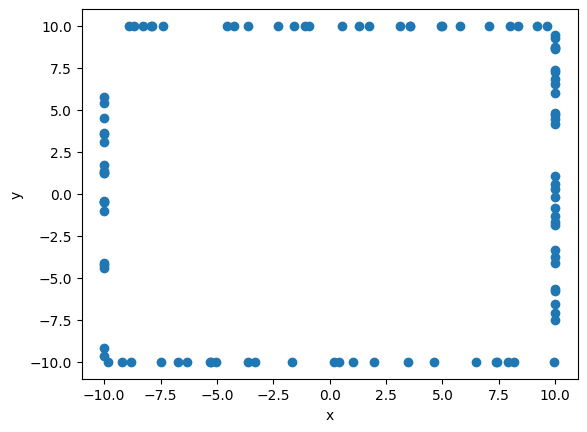

In [63]:
# visualize(points_c)
vis.clear()
vis.add_point(points_c)
vis.show()

Uzupełnij funkcję ```generate_square_points```.

In [11]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu
    leżących na osiach x i y oraz diag_n punktów na
    przektąnych kwadratu, którego wyznaczają punkty
    a, b, c i d.
    :param a: lewy-dolny wierzchołek kwadratu
    :param b: prawy-dolny wierzchołek kwadratu
    :param c: prawy-górny wierzchołek kwadratu
    :param d: lewy-górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym
                   z dwóch boków kwadratu równoległych do osi x i y
    :param diag_n: ilość generowanych punktów na każdej
                   przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    points = []
    side_len = abs(b[0]-b[1])
    for _ in range(axis_n):
        t = np.random.uniform(0,side_len)
        points.append((a[0]+t,a[1]))
        
    for _ in range(axis_n):
        t = np.random.uniform(0,side_len)
        points.append((a[0],a[1]+t))
       
    for _ in range(diag_n):
        t = np.random.uniform(0,side_len)
        points.append((a[0]+t,a[1]+t))
        
    for _ in range(diag_n):
        t = np.random.uniform(0,side_len)
        points.append((a[0]+t,a[1]+side_len-t))
    points.append(a)
    points.append(b)
    points.append(c)
    points.append(d)
        
    return points

<span style="color:red">Ćw.</span> Wygeneruj losowe punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [12]:
points_d = generate_square_points(
    (0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

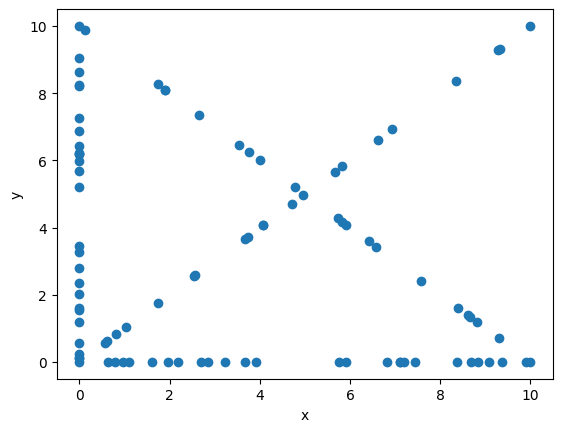

In [48]:
# visualize(points_d)
vis.clear()
vis.add_point(points_d)
vis.show()

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie Stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $x$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

Funkcje pomocnicze ogólne

In [13]:
eps = 10**(-24)
def det(a, b, c):
    #liczę wyznacznik
    a_x, a_y = a
    b_x, b_y = b
    c_x, c_y = c
    first = (a_x - c_x) * (b_y - c_y)
    second = (a_y - c_y) * (b_x - c_x)
    return first - second

def is_on_left(a,b,c):
    # sprawdzam, jak punkt c jest ułożony względem prostej ab
    return det(a,b,c) < eps

def find_min_point(points_tab):
    # szukam punktu najniższego, i skrajnie lewego
    # points_tab = (x,y)
    n=len(points_tab)
    min_point=points_tab[0]
    for i in range(1,n):
        if points_tab[i][1]<min_point[1] or (points_tab[i][1]==min_point[1] and points_tab[i][0]<min_point[0]):
            min_point=points_tab[i]
    return min_point


Funkcje specyficzne dla algorytmu Grahama metodą wyznacznika

In [14]:

def dist(a,b):
    # funkcja licząca dystans miedzy dwoma punktami
    return (a[0]-b[0])**2+(a[1]-b[1])**2


def compare_for_Graham(a,b,c):
    # ta funkcja zwraca informacje, czy punkt c jest na lewo, czy na prawo od prostej ab

    res = det(a,b,c)
    if -eps < res < eps: # jeżeli leżą na lini
        return  dist(a,b) - dist(a,c) # biorę ten co jest dalej
    else: 
        return -res


def delate_points_on_line(Q):
    # dostaje posortowaną tablice po kącie
    uniq_angles = []
    uniq_angles.append(Q[0])

    for i in range(2,len(Q)):
        if not -eps<det(Q[0],Q[i-1],Q[i]) < eps: # jeżeli nie leżą na lini
            uniq_angles.append(Q[i-1]) # dodaje do listy
    if len(Q)>1:
        uniq_angles.append(Q[-1]) # przypadek brzegowy
    return uniq_angles
    

Algorytm Grahama metodą wyznacznika

In [15]:

def graham_algorithm_with_det(Q):
    from functools import cmp_to_key
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    # znajduje punkt najniższy, najbardziej lewy
    q=find_min_point(Q)
    # sortuje je po kącie za pomocą wyznacznika
    Q.sort(key=cmp_to_key(lambda a, b: compare_for_Graham(q, a, b)))
    # usuwam duplikaty
    T = delate_points_on_line(Q)
    n=len(T)
    # S - nasza otoczka
    S=[]
    # algorytm właściwy
    for i in range(min(n,3)):
        S.append(T[i])
    for i in range(3,n):
        while len(S)>2 and is_on_left(S[-2],S[-1],T[i]):
            S.pop()
        S.append(T[i])
    return S 

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [86]:
Test().runtest(1, graham_algorithm_with_det)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 2.243s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

Dla metody z wyznacznikiem

In [16]:
def graham_algorithm_with_det_draw(Q):
    from functools import cmp_to_key
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    vis = Visualizer()
    vis.clear()
    vis.add_point(Q)
    q=find_min_point(Q)
    edges = [] #lista odcinków dla visualizera
    Q.sort(key=cmp_to_key(lambda a, b: compare_for_Graham(q, a, b)))
    T=delate_points_on_line(Q)
    n=len(T)
    S=[]
    for i in range(min(n,3)):
        S.append(T[i])
        vis.add_point(T[i], color = "red") # zaznaczam, które aktualnie są w otoczce
    
    for i in range(min(n-1,2)):
        ls = vis.add_line_segment([S[i],S[i+1]],color="red")
        edges.append(ls)

    for i in range(3,n):
        while len(S)>2 and is_on_left(S[-2],S[-1],T[i]):
            vis.remove_figure(edges[-1])
            vis.add_point(S[-1],color="brown") #wierzchołek wyrzucony z otoczki
            edges.pop()
            S.pop()
        S.append(T[i])
        vis.add_point(S[-1],color="red") # oznczenie wierzchołka dodanego do otoczki
        ls=vis.add_line_segment([S[-2],S[-1]],color="red") # narysowanie lini łączącej nowy punkt z otoczką
        edges.append(ls) 
    vis.add_line_segment([S[-1],S[0]],color="red")
    return S,vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [39]:
graham_points_a, vis_graham_a = graham_algorithm_with_det_draw(points_a)
graham_points_a_to_print = [(float(el_x),float(el_y),) for el_x,el_y in graham_points_a]
print(graham_points_a_to_print)
print("Ilość punktów otoczki: ",len(graham_points_a))

[(-51.588028476650734, -97.21388703829015), (91.70331808213123, -92.02748117717464), (97.77437554896437, -75.34868424513763), (96.51980563421142, -12.125998586110072), (91.44871360258318, 75.68283384692629), (63.86444305214255, 87.91879306117798), (30.97896031149037, 93.01876270149384), (-58.38475661580724, 99.64150662928111), (-87.189654855744, 88.8019457154112), (-97.36887675546713, 63.37475504406348), (-97.97363962343817, 25.307498029473095), (-98.11667427521814, -23.84988399400669), (-97.78920759893694, -86.55722143557381)]
Ilość punktów otoczki:  13


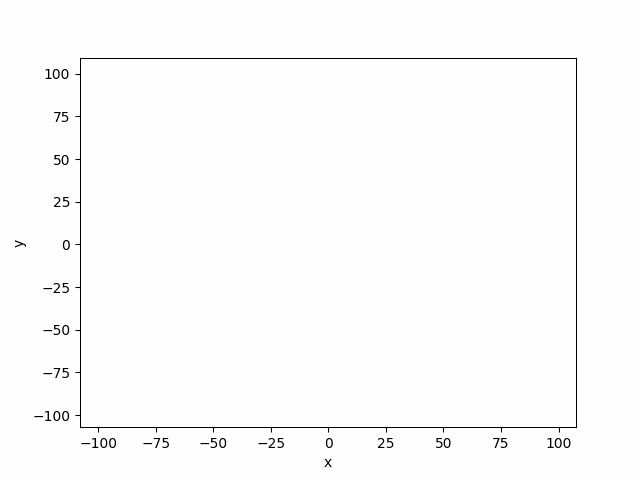

In [88]:
vis_graham_a.show_gif(interval=200)

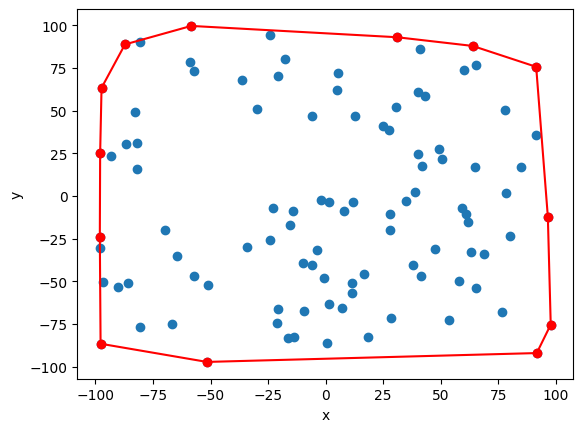

In [27]:
# visualize(graham_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point(graham_points_a,color="red")
vis.add_line_segment([(graham_points_a[i], graham_points_a[i+1]) for i in range(len(graham_points_a)-1)],color="red")
vis.add_line_segment([graham_points_a[-1], graham_points_a[0]],color="red")
vis.show()

Zbiór danych B

In [38]:
graham_points_b, vis_graham_b = graham_algorithm_with_det_draw(points_b)
graham_points_b_to_print = [(float(el_x),float(el_y),) for el_x,el_y in graham_points_b]
print(graham_points_b_to_print)
print("Ilość punktów otoczki: ",len(graham_points_b))

[(-0.7560134831656504, -9.971381228960798), (1.5613272492585173, -9.87736084289335), (2.2798130998957644, -9.736655084244468), (2.418817606206638, -9.703057321684994), (4.161204285660025, -9.093095121739607), (4.206598041699162, -9.072184572393398), (4.251696103496549, -9.0511369586098), (4.5978539144492725, -8.880300635754597), (4.786164340328015, -8.780240936749543), (5.499733186135851, -8.351822249145153), (6.066614653454346, -7.9496029238253785), (6.358286810444537, -7.7183021990672955), (8.22321645368975, -5.690229446671388), (8.962497636326418, -4.435497279769581), (9.023421050546224, -4.31020562671426), (9.277894411840073, -3.7310421175251745), (9.423154696432835, -3.3472609051425577), (9.532984959300215, -3.0202976286710315), (9.583585211274492, -2.8556775900372293), (9.84108256545581, -1.7756953398265396), (9.951882145778999, -0.9798172056690944), (9.996626692496287, 0.2597205630495151), (9.990543764222279, 0.434781893780464), (9.757266769019818, 2.1899189935204335), (9.250941

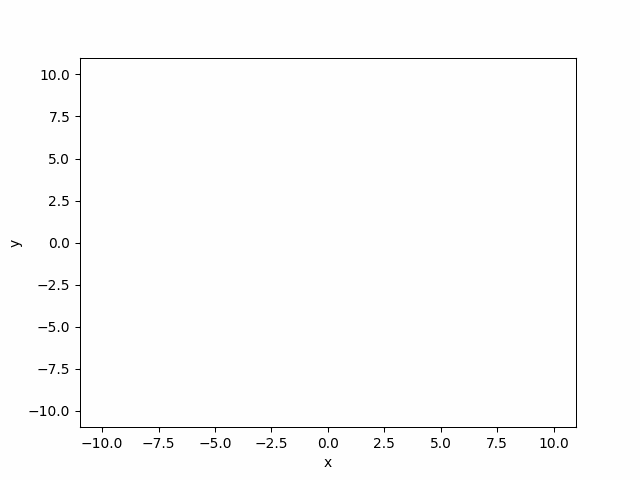

In [257]:
vis_graham_b.show_gif()

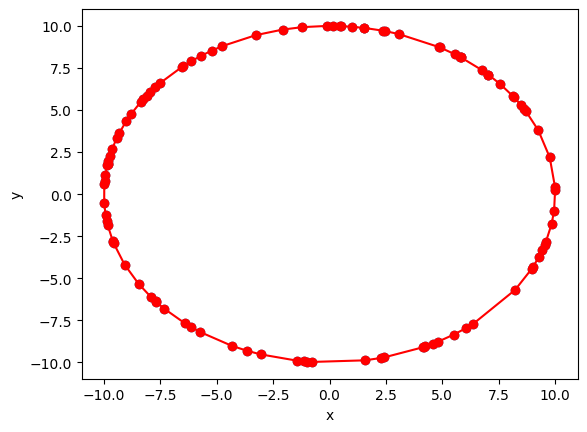

In [19]:
# visualize(graham_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point(graham_points_b,color="red")
vis.add_line_segment([(graham_points_b[i], graham_points_b[i+1]) for i in range(len(graham_points_b)-1)],color="red")
vis.add_line_segment([graham_points_b[-1], graham_points_b[0]],color="red")
vis.show()

Zbiór danych C

In [40]:
graham_points_c, vis_graham_c = graham_algorithm_with_det_draw(points_c)
graham_points_c_to_print = [(float(el_x),float(el_y),) for el_x,el_y in graham_points_c]
print(graham_points_c_to_print)
print("Ilość punktów otoczki: ",len(graham_points_c))

[(-8.68604206236193, -10.0), (9.390149250198114, -10.0), (10.0, -8.85276764507168), (10.0, 8.424543297278298), (9.956504357353765, 10.0), (-9.24854305335576, 10.0), (-10.0, 8.550670971835281), (-10.0, -9.782743252219547)]
Ilość punktów otoczki:  8


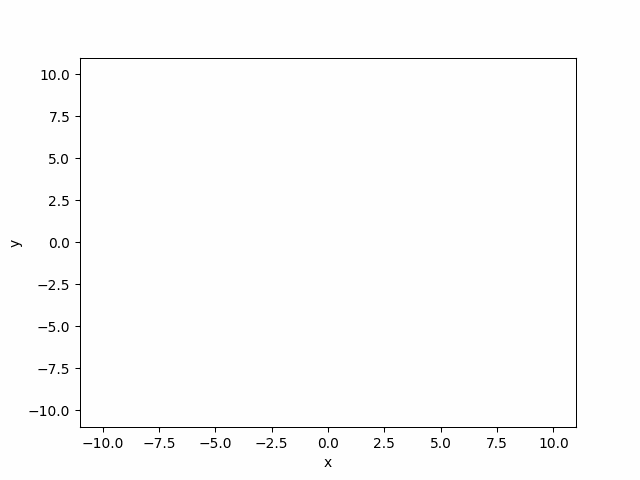

In [87]:
vis_graham_c.show_gif()

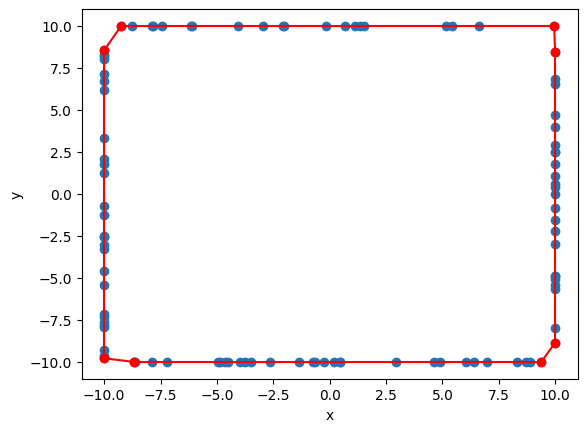

In [32]:
# visualize(graham_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point(graham_points_c,color = 'red')
vis.add_line_segment([(graham_points_c[i], graham_points_c[i+1]) for i in range(len(graham_points_c)-1)],color="red")
vis.add_line_segment([graham_points_c[-1], graham_points_c[0]],color="red")
vis.show()

Zbiór danych D

In [41]:
graham_points_d, vis_graham_d = graham_algorithm_with_det_draw(points_d)
graham_points_d_to_print = [(float(el_x),float(el_y),) for el_x,el_y in graham_points_d]
print(graham_points_d_to_print)
print("Ilość punktów otoczki: ",len(graham_points_d))

[(0.0, 0.0), (10.0, 0.0), (10.0, 10.0), (0.0, 10.0)]
Ilość punktów otoczki:  4


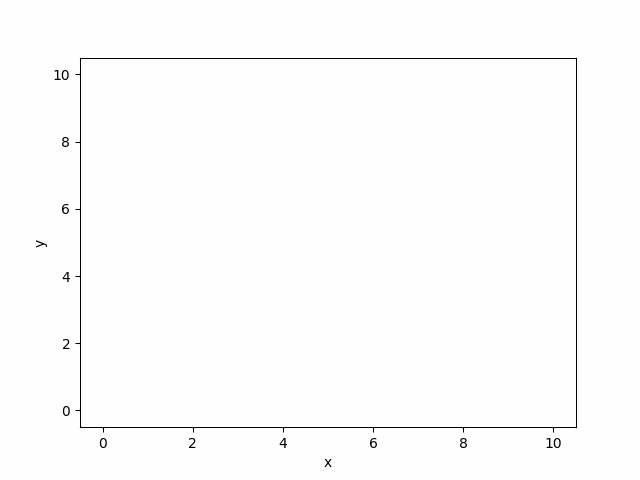

In [85]:
vis_graham_d.show_gif()

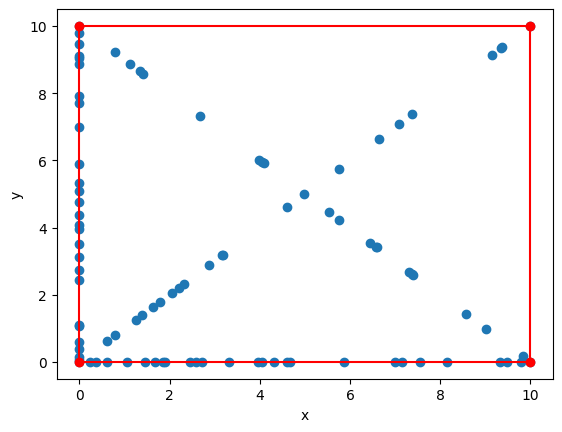

In [35]:
# visualize(graham_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point(graham_points_d,color = 'red')
vis.add_line_segment([(graham_points_d[i], graham_points_d[i+1]) for i in range(len(graham_points_d)-1)],color="red")
vis.add_line_segment([graham_points_d[-1], graham_points_d[0]],color="red")
vis.show()

### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

Funkcje pomocnicze

In [22]:
eps = 10**(-24)

def compare_for_Jarvis(a,b,c):
    res = det(a,b,c)
    if -eps < res < eps:
        return  dist(a,c)-dist(a,b)
    else: 
        return -res

Algorytm Jarvisa

In [23]:
def jarvis_algorithm(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego zbioru punktów Q algorymem Jarvisa
    :param Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    n = len(Q)
    if n <= 2: return Q
    final_tab = [find_min_point(Q)]
    min_angle_point = None
    while min_angle_point != final_tab[0]:
        
        if Q[0]!=final_tab[-1]: min_angle_point=Q[0]
        else:
            min_angle_point = Q[1]

        for i in range(n):
            if Q[i] ==final_tab[-1]: continue
            if compare_for_Jarvis(final_tab[-1],min_angle_point,Q[i])>0: 
                min_angle_point = Q[i]
        if min_angle_point!=final_tab[0]:
            final_tab.append(min_angle_point)
    return final_tab

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [73]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 2.566s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [24]:
def jarvis_algorithm_draw(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa oraz 
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci  (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    n = len(Q)
    if n <= 2: return Q
    final_tab = [find_min_point(Q)]
    vis = Visualizer()
    vis.add_point(Q)
    vis.add_point(final_tab[0],color="red")
    min_angle_point = None
    flaga = False
    while min_angle_point != final_tab[0]:
        
        if Q[0]!=final_tab[-1]: min_angle_point=Q[0]
        else:
            min_angle_point = Q[1]

        for i in range(n):
            if Q[i] ==final_tab[-1]: continue
            if compare_for_Jarvis(final_tab[-1],min_angle_point,Q[i])>0: 
                if flaga:
                    vis.remove_figure(ls)
                    vis.remove_figure(p)
                else: flaga = True
                min_angle_point = Q[i]
                p=vis.add_point(min_angle_point,color="yellow")
                ls=vis.add_line_segment([final_tab[-1],Q[i]],color="yellow")
        if min_angle_point!=final_tab[0]:
            vis.add_point(min_angle_point,color="red")
            vis.add_line_segment((final_tab[-1],min_angle_point),color="red")
            final_tab.append(min_angle_point)
        else: vis.add_point(final_tab[0],color="red")
    vis.add_line_segment((final_tab[-1],final_tab[0]),color="red")
    return final_tab, vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [42]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)
jarvis_points_a_to_print = [(float(el_x),float(el_y),) for el_x,el_y in jarvis_points_a]
print(jarvis_points_a_to_print)
print("Ilość punktów otoczki: ",len(jarvis_points_a))

[(-51.588028476650734, -97.21388703829015), (91.70331808213123, -92.02748117717464), (97.77437554896437, -75.34868424513763), (96.51980563421142, -12.125998586110072), (91.44871360258318, 75.68283384692629), (63.86444305214255, 87.91879306117798), (30.97896031149037, 93.01876270149384), (-58.38475661580724, 99.64150662928111), (-87.189654855744, 88.8019457154112), (-97.36887675546713, 63.37475504406348), (-97.97363962343817, 25.307498029473095), (-98.11667427521814, -23.84988399400669), (-97.78920759893694, -86.55722143557381)]
Ilość punktów otoczki:  13


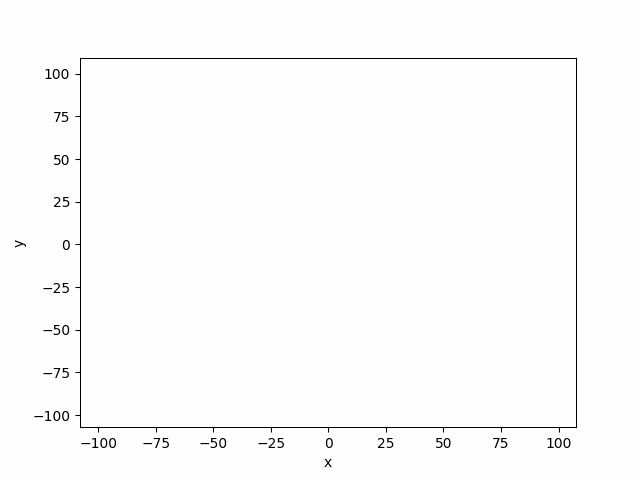

In [323]:
vis_jarvis_a.show_gif()

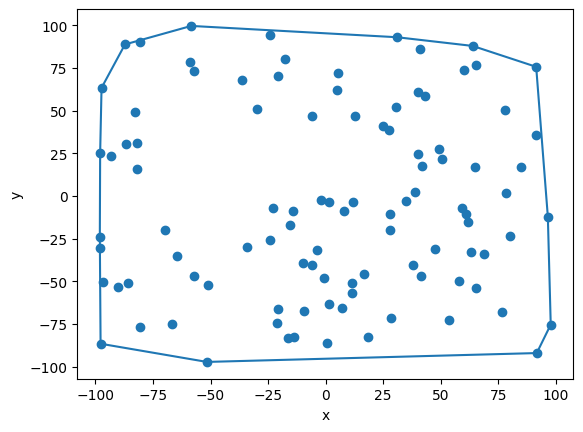

In [41]:
# visualize(jarvis_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)])
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]])
vis.show()

Zbiór danych B

In [43]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)
jarvis_points_b_to_print = [(float(el_x),float(el_y),) for el_x,el_y in jarvis_points_b]
print(jarvis_points_b_to_print)
print("Ilość punktów otoczki: ",len(jarvis_points_b))

[(-0.7560134831656504, -9.971381228960798), (1.5613272492585173, -9.87736084289335), (2.2798130998957644, -9.736655084244468), (2.418817606206638, -9.703057321684994), (4.161204285660025, -9.093095121739607), (4.206598041699162, -9.072184572393398), (4.251696103496549, -9.0511369586098), (4.5978539144492725, -8.880300635754597), (4.786164340328015, -8.780240936749543), (5.499733186135851, -8.351822249145153), (6.066614653454346, -7.9496029238253785), (6.358286810444537, -7.7183021990672955), (8.22321645368975, -5.690229446671388), (8.962497636326418, -4.435497279769581), (9.023421050546224, -4.31020562671426), (9.277894411840073, -3.7310421175251745), (9.423154696432835, -3.3472609051425577), (9.532984959300215, -3.0202976286710315), (9.583585211274492, -2.8556775900372293), (9.84108256545581, -1.7756953398265396), (9.951882145778999, -0.9798172056690944), (9.996626692496287, 0.2597205630495151), (9.990543764222279, 0.434781893780464), (9.757266769019818, 2.1899189935204335), (9.250941

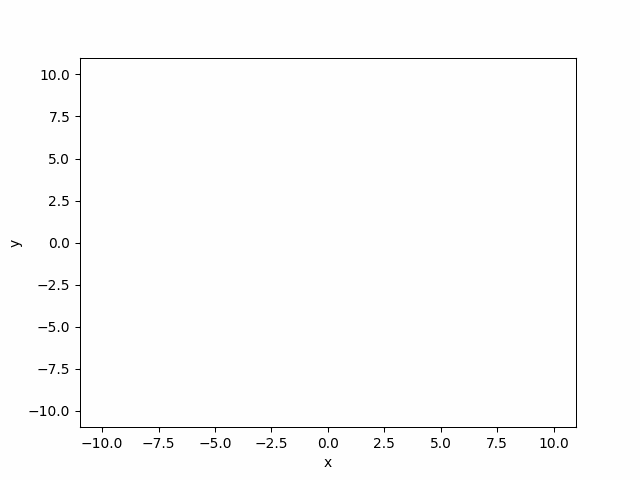

In [338]:
vis_jarvis_b.show_gif()

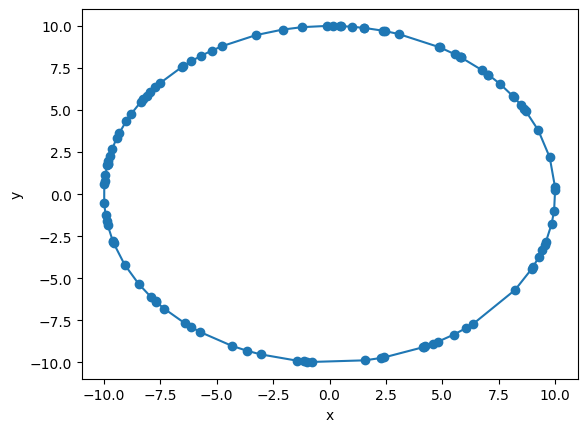

In [27]:
# visualize(jarvis_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_line_segment([(jarvis_points_b[i], jarvis_points_b[i+1]) for i in range(len(jarvis_points_b)-1)])
vis.add_line_segment([jarvis_points_b[-1], jarvis_points_b[0]])
vis.show()

Zbiór danych C

In [44]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)
jarvis_points_c_to_print = [(float(el_x),float(el_y),) for el_x,el_y in jarvis_points_c]
print(jarvis_points_c_to_print)
print("Ilość punktów otoczki: ",len(jarvis_points_c))

[(-8.68604206236193, -10.0), (9.390149250198114, -10.0), (10.0, -8.85276764507168), (10.0, 8.424543297278298), (9.956504357353765, 10.0), (-9.24854305335576, 10.0), (-10.0, 8.550670971835281), (-10.0, -9.782743252219547)]
Ilość punktów otoczki:  8


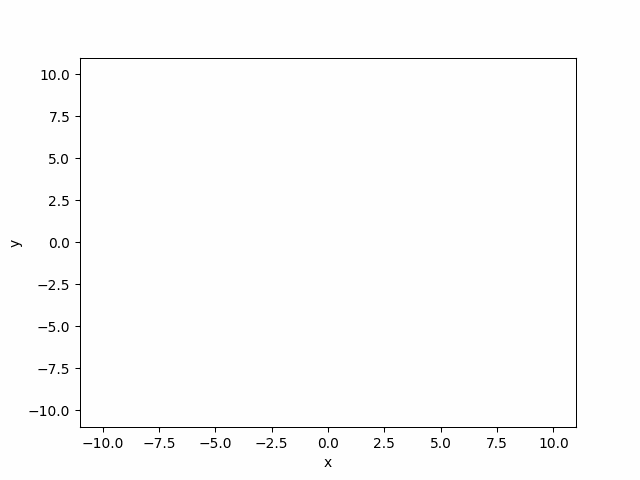

In [65]:
vis_jarvis_c.show_gif()

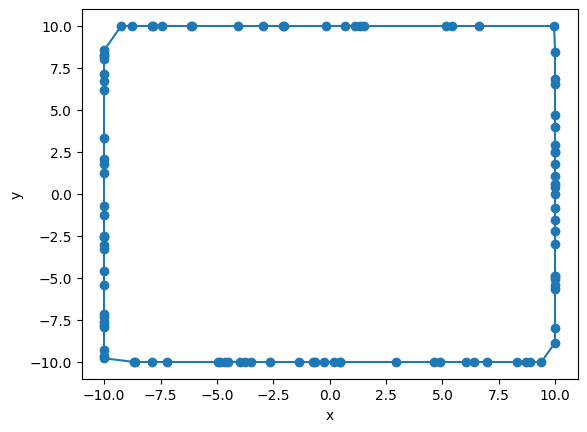

In [45]:
# visualize(jarvis_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_line_segment([(jarvis_points_c[i], jarvis_points_c[i+1]) for i in range(len(jarvis_points_c)-1)])
vis.add_line_segment([jarvis_points_c[-1], jarvis_points_c[0]])
vis.show()

Zbiór danych D

In [45]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)
jarvis_points_d_to_print = [(float(el_x),float(el_y),) for el_x,el_y in jarvis_points_d]
print(jarvis_points_d_to_print)
print("Ilość punktów otoczki: ",len(jarvis_points_d))

[(0.0, 0.0), (10.0, 0.0), (10.0, 10.0), (0.0, 10.0)]
Ilość punktów otoczki:  4


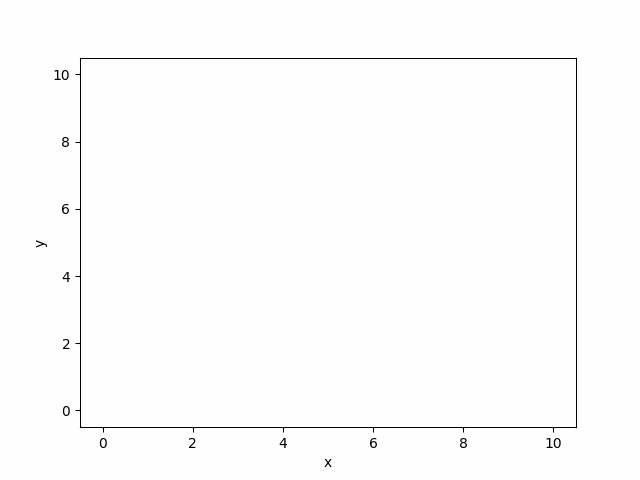

In [50]:
vis_jarvis_d.show_gif()

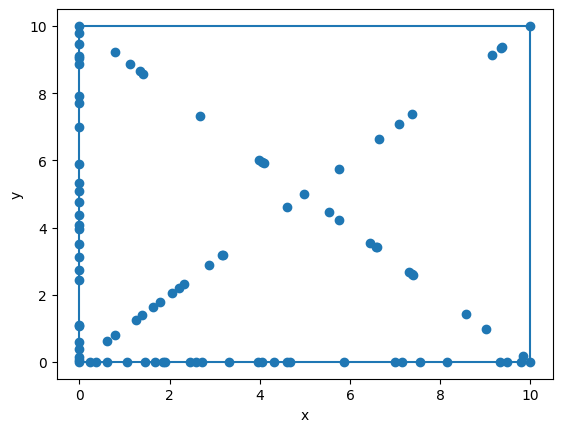

In [47]:
# visualize(jarvis_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_line_segment([(jarvis_points_d[i], jarvis_points_d[i+1]) for i in range(len(jarvis_points_d)-1)])
vis.add_line_segment([jarvis_points_d[-1], jarvis_points_d[0]])
vis.show()

Porównanie zbiorów zebranych otoczek

In [ ]:
if len(set(graham_points_a)-set(jarvis_points_a))==0: print("Znaleziono te same punkty dla zbioru A")
if len(set(graham_points_b)-set(jarvis_points_b))==0: print("Znaleziono te same punkty dla zbioru B")
if len(set(graham_points_c)-set(jarvis_points_c))==0: print("Znaleziono te same punkty dla zbioru C")
if len(set(graham_points_d)-set(jarvis_points_d))==0: print("Znaleziono te same punkty dla zbioru D")


Znaleziono te same punkty dla zbioru A
Znaleziono te same punkty dla zbioru B
Znaleziono te same punkty dla zbioru C
Znaleziono te same punkty dla zbioru D



---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [34]:
np.random.seed(345)
no_points_acd=[1000,2500,5000,10000,25000,40000,55000,70000,85000,100000]
no_points_b=[100,500,1000,2000,3000,5000,7000,9000,11000,13000]
new_points_a=[generate_uniform_points(-1000, 1000, no_points_acd[i]) for i in range(len(no_points_acd))]
new_points_d=[generate_square_points((0,0), (400,0), (400,400), (0,400), int(0.3*no_points_acd[i])-1, int(0.2*no_points_acd[i])-1) for i in range(len(no_points_acd))]
new_points_c=[generate_rectangle_points((-500,-200), (100,-200), (100,300), (-500,300), no_points_acd[i]) for i in range(len(no_points_acd))]
new_points_b=[generate_circle_points((100,100), 2000, no_points_b[i]) for i in range(len(no_points_b))]

Po przygotowaniu zbioru danych, dokonaj porównania czasowego  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

Zbiór A
        liczba punktów w otoczce    Graham    Jarvis
1000                          18  0.005046  0.008980
2500                          20  0.013527  0.023831
5000                          24  0.029991  0.056516
10000                         28  0.063272  0.128980
25000                         29  0.198421  0.359298
40000                         34  0.312877  0.671950
55000                         31  0.455436  0.848242
70000                         35  0.592182  1.214626
85000                         29  0.743615  1.243697
100000                        28  0.883682  1.371029



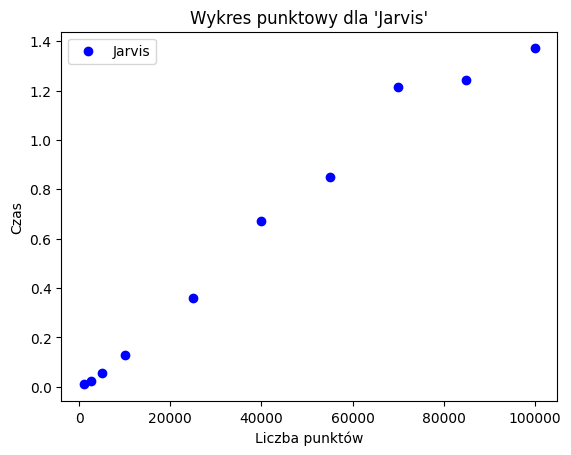

Zbiór B
       liczba punktów w otoczce    Graham     Jarvis
100                         100  0.000376   0.004607
500                         500  0.002039   0.115222
1000                       1000  0.004483   0.449383
2000                       2000  0.009827   1.811898
3000                       3000  0.015195   4.038954
5000                       5000  0.027545  12.143395
7000                       7000  0.039639  22.813617
9000                       9000  0.052898  37.047571
11000                     11000  0.066642  55.190385
13000                     13000  0.080072  77.733504



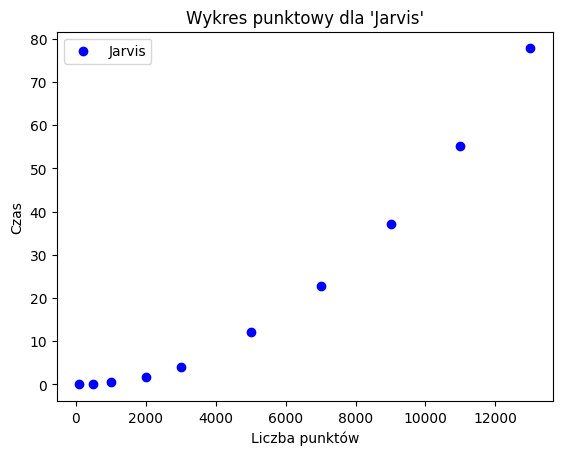

Zbiór C
        liczba punktów w otoczce    Graham    Jarvis
1000                           8  0.004050  0.004173
2500                           8  0.011600  0.008008
5000                           8  0.025496  0.016174
10000                          8  0.054649  0.032412
25000                          8  0.153395  0.079164
40000                          8  0.259465  0.128758
55000                          8  0.383095  0.179600
70000                          8  0.498094  0.226380
85000                          8  0.621577  0.273851
100000                         8  0.748703  0.323504



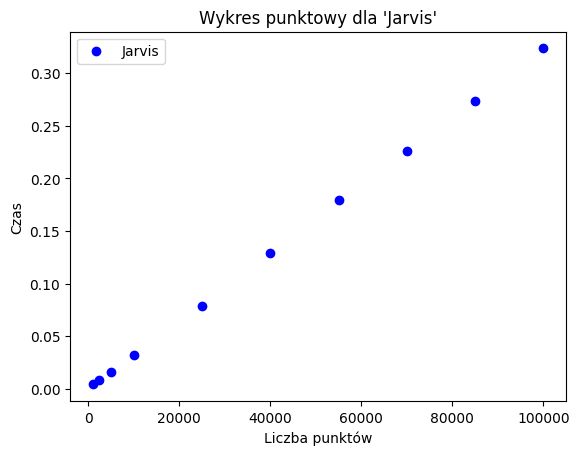

Zbiór D
        liczba punktów w otoczce    Graham    Jarvis
1000                           4  0.005635  0.001872
2500                           4  0.015848  0.004637
5000                           4  0.035124  0.009256
10000                          4  0.076899  0.017945
25000                          4  0.216260  0.044984
40000                          4  0.367603  0.073169
55000                          4  0.544117  0.103906
70000                          4  0.690484  0.129254
85000                          4  0.855667  0.157092
100000                         4  1.027556  0.179813



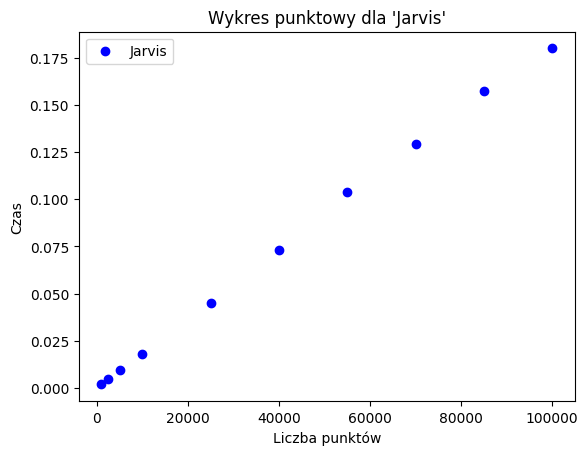

In [ ]:
from time import time
import copy
import matplotlib.pyplot as plt
new_points=[("Zbiór A",new_points_a), ("Zbiór B",new_points_b), ("Zbiór C",new_points_c), ("Zbiór D",new_points_d)]
times_tab = [[0 for _ in range(3)] for _ in range(len(no_points_acd))]
for i in range (len(new_points)):
    for j in range(len(new_points[i][1])):

        # algorytm Jarvisa
        t = copy.deepcopy(new_points[i][1][j])
        t0=time()
        v1=jarvis_algorithm(t)
        t1=time()
        times_tab[j][2] = t1-t0
        
        # algorytm grahama
        t = copy.deepcopy(new_points[i][1][j])
        t0=time()
        v2=graham_algorithm_with_det(t)
        t1=time()
        times_tab[j][1] = t1-t0

        # sprawdzenie czy te same otoczki
        if len(set(v1)-set(v2))!=0: times_tab[j][0] = "Błąd"
        else: times_tab[j][0] = len(v1)
        
    print(new_points[i][0])
    if i==1: df_b = pd.DataFrame(data = times_tab, columns=['liczba punktów w otoczce', 'Graham', 'Jarvis'], index=no_points_b)
    else: df_b = pd.DataFrame(data = times_tab, columns=['liczba punktów w otoczce', 'Graham', 'Jarvis'], index=no_points_acd)
    print(df_b)
    print()
    if i==0:df_b.to_csv("ZbiorA.csv", index=True)
    elif i==1:df_b.to_csv("ZbiorB.csv", index=True)
    elif i==2:df_b.to_csv("ZbiorC.csv", index=True)
    elif i==3:df_b.to_csv("ZbiorD.csv", index=True)
    x = df_b.index  # Użycie indeksu jako osi X
    y = df_b["Jarvis"]  # Wybór kolumny jako osi Y

    plt.scatter(x, y, label="Jarvis", color='b', marker='o')
    plt.xlabel("Liczba punktów")
    plt.ylabel("Czas")
    plt.title("Wykres punktowy dla 'Jarvis'")
    plt.legend()
    plt.show()

# Wyniki minimalnie odbiegają od tych ujętych w sprawozdaniu, ponieważ kod został ponownie uruchomiony po napisaniu sprawozdania

WNIOSKI HERE  
W sprawozdaniu napisz, czy Twój program działał poprawnie dla wszystkich zbiorów
danych oraz opisz krótko wnioski dotyczące działania algorytmu dla poszczególnych
zbiorów. Napisz, dlaczego wg Ciebie zaproponowano takie zbiory punktów? Które ze
zbiorów mogły stwarzać problemy w działaniu algorytmów? Jeśli tak, to jakie i
dlaczego? Porównaj czasy działania obu algorytmów w zależności od liczby punktów
w poszczególnych zbiorach (A, B, C, D). Dołącz wybrane, istotne ilustracje.

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
